### 1. Importing packages

In [1]:
# !pip install split-folders
! pip install tensorflow==2.13.1


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import tensorflow as tf
from tensorflow.keras import layers, models
# from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [3]:
# checking gpu support
tf.config.experimental.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

In [4]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
from tabulate import tabulate

In [5]:
# import splitfolders
import os
import numpy as np
import pandas as pd
import random

### 2. Loading dataset

In [6]:
# defining constants
BATCH_SIZE = 32
IMG_SIZE = 256
EPOCHS = 50

In [8]:
# project's main directory
prj_dir = '/content/drive/MyDrive/Tomato_leaf'

In [9]:
# building tf input data pipeline
ds = tf.keras.utils.image_dataset_from_directory(
    f'{prj_dir}',
    batch_size=BATCH_SIZE,
    image_size=(IMG_SIZE, IMG_SIZE),
    shuffle=True
)

Found 319 files belonging to 2 classes.


In [10]:
#here our len is 10 because our batch size is 32
len(ds)

10

In [11]:
10*32

320

In [12]:
# getting class names
class_names = ds.class_names
class_names

['Healthy', 'Infected']

Batch 1 Imgs shape: (32, 256, 256, 3)
Batch 1 Lbls: [1 0 0 0 0 0 1 1 0 1 0 1 0 0 1 0 0 1 1 0 0 1 0 1 1 0 0 1 0 0 1 0]


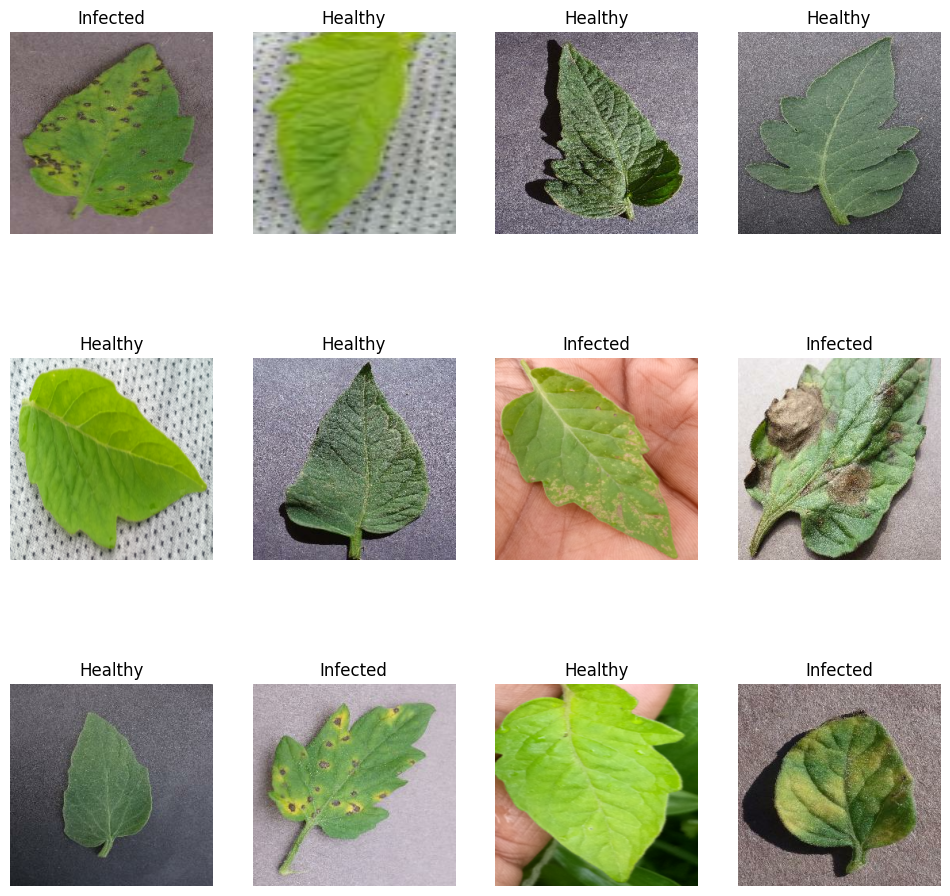

In [13]:
# displaying sample data
img = None

plt.figure(figsize=(12, 12))

for imgs, lbls in ds.take(1):
    print(f'Batch 1 Imgs shape: {imgs.shape}')
    print(f'Batch 1 Lbls: {lbls.numpy()}')

    img = imgs[0].numpy().astype('uint8') # taking sample image

    for i in range(12):
        plt.subplot(3, 4, i + 1)
        plt.imshow(imgs[i].numpy().astype('uint8'))
        plt.title(class_names[lbls[i]])
        plt.axis('off')

3. **Data preprocessing**




In [ ]:
! pip install rembg


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 39.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.4 MB/s eta 0:00:00


***Background colour remover***

Batch 1 Imgs shape: (32, 224, 224, 3)
Batch 1 Lbls: [1 1 1 0 0 1 1 0 1 1 0 1 0 1 0 1 1 0 1 1 1 1 0 0 0 1 1 0 0 0 1 0]


100%|███████████████████████████████████████| 176M/176M [00:00<00:00, 37.3GB/s]


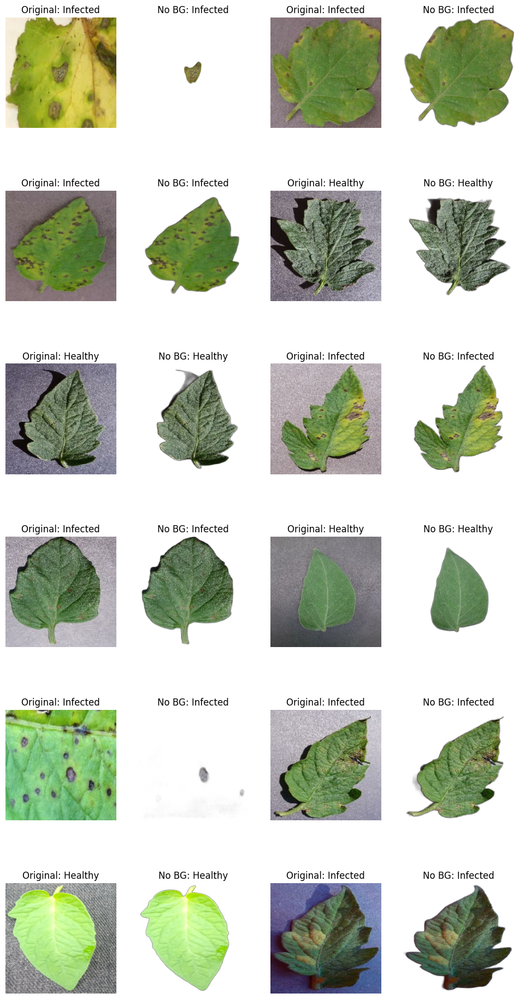

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from rembg import remove

img = None


plt.figure(figsize=(12, 24))

for imgs, lbls in ds.take(1):
    print(f'Batch 1 Imgs shape: {imgs.shape}')
    print(f'Batch 1 Lbls: {lbls.numpy()}')
    img = imgs[0].numpy().astype('uint8')  # taking sample image
    for i in range(12):
        plt.subplot(6, 4, i * 2 + 1)
        plt.imshow(imgs[i].numpy().astype('uint8'))
        plt.title(f'Original: {class_names[lbls[i]]}')
        plt.axis('off')

        img_without_bg = remove(imgs[i].numpy().astype('uint8'))

        plt.subplot(6, 4, i * 2 + 2)
        plt.imshow(img_without_bg)
        plt.title(f'No BG: {class_names[lbls[i]]}')
        plt.axis('off')

plt.show()


In [ ]:
import numpy as np
from rembg import remove
from PIL import Image
import os
import glob

# Paths to the original data folders
base_path = '/content/drive/MyDrive/Tomato_leaf'
healthy_path = os.path.join(base_path, 'Healthy')
infected_path = os.path.join(base_path, 'Infected')

output_healthy_path = os.path.join(base_path, 'healthy_bg_removed')
output_infected_path = os.path.join(base_path, 'infected_bg_removed')

os.makedirs(output_healthy_path, exist_ok=True)
os.makedirs(output_infected_path, exist_ok=True)

def remove_background_and_save(input_path, output_path):
    image_extensions = ['*.jpg', '*.jpeg', '*.png']

    image_paths = []
    for ext in image_extensions:
        image_paths.extend(glob.glob(os.path.join(input_path, '**', ext), recursive=True))
        image_paths.extend(glob.glob(os.path.join(input_path, '**', ext.upper()), recursive=True))

    print(f"Found {len(image_paths)} images in {input_path}")

    for image_path in image_paths:
        try:
            print(f"Processing {image_path}")
            img = Image.open(image_path)
            img_np = np.array(img)

            # Remove background from the image
            img_without_bg = remove(img_np)

            # Save the background removed image
            img_without_bg_pil = Image.fromarray(img_without_bg)

            # If the original image is a JPEG, convert to RGB mode before saving
            if image_path.lower().endswith(('.jpg', '.jpeg')):
                img_without_bg_pil = img_without_bg_pil.convert('RGB')

            # Construct output filename
            filename = os.path.basename(image_path)
            output_image_path = os.path.join(output_path, filename)
            img_without_bg_pil.save(output_image_path)
            print(f"Saved {output_image_path}")
        except Exception as e:
            print(f"Error processing {image_path}: {e}")

# Process healthy images
remove_background_and_save(healthy_path, output_healthy_path)

# Process infected images
remove_background_and_save(infected_path, output_infected_path)


Found 163 images in /content/drive/MyDrive/Tomato_leaf/Healthy
Processing /content/drive/MyDrive/Tomato_leaf/Healthy/hl_ (85).jpg
Saved /content/drive/MyDrive/Tomato_leaf/healthy_bg_removed/hl_ (85).jpg
Processing /content/drive/MyDrive/Tomato_leaf/Healthy/hl_ (89).jpg
Saved /content/drive/MyDrive/Tomato_leaf/healthy_bg_removed/hl_ (89).jpg
Processing /content/drive/MyDrive/Tomato_leaf/Healthy/hl_ (81).jpg
Saved /content/drive/MyDrive/Tomato_leaf/healthy_bg_removed/hl_ (81).jpg
Processing /content/drive/MyDrive/Tomato_leaf/Healthy/hl_ (65).jpg
Saved /content/drive/MyDrive/Tomato_leaf/healthy_bg_removed/hl_ (65).jpg
Processing /content/drive/MyDrive/Tomato_leaf/Healthy/hl_ (66).jpg
Saved /content/drive/MyDrive/Tomato_leaf/healthy_bg_removed/hl_ (66).jpg
Processing /content/drive/MyDrive/Tomato_leaf/Healthy/hl_ (67).jpg
Saved /content/drive/MyDrive/Tomato_leaf/healthy_bg_removed/hl_ (67).jpg
Processing /content/drive/MyDrive/Tomato_leaf/Healthy/hl_ (68).jpg
Saved /content/drive/MyDrive/T

In [7]:
# defining constants
BATCH_SIZE = 32
IMG_SIZE = 256
EPOCHS = 50

In [8]:
# project's main directory
prj_dir = '/content/drive/My Drive/TomatoLeafDetection/preprocessed'

In [9]:
# building tf input data pipeline
ds = tf.keras.utils.image_dataset_from_directory(
    f'{prj_dir}',
    batch_size=BATCH_SIZE,
    image_size=(IMG_SIZE, IMG_SIZE),
    shuffle=True
)

Found 319 files belonging to 2 classes.


In [10]:
len(ds)

10

In [11]:
# getting class names
class_names = ds.class_names
class_names

['healthy', 'infected']

Batch 1 Imgs shape: (32, 256, 256, 3)
Batch 1 Lbls: [0 1 1 0 1 0 0 1 0 1 0 0 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 1 0 0 1 0]


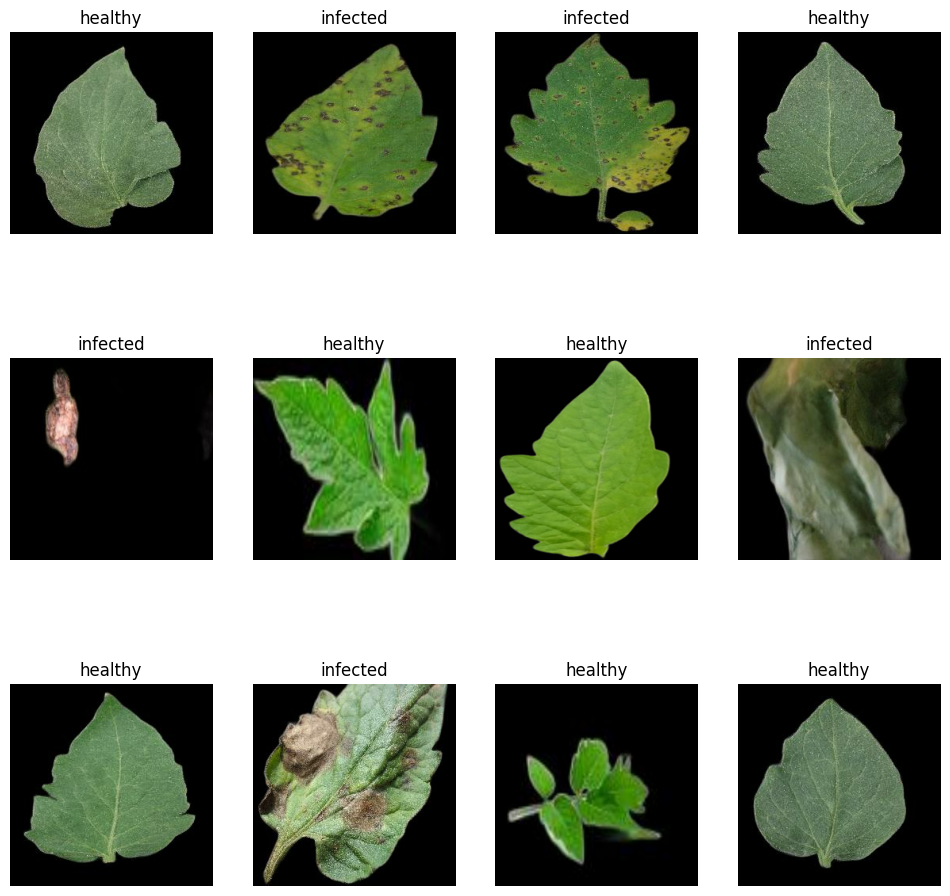

In [12]:
# displaying sample data
img = None

plt.figure(figsize=(12, 12))

for imgs, lbls in ds.take(1):
    print(f'Batch 1 Imgs shape: {imgs.shape}')
    print(f'Batch 1 Lbls: {lbls.numpy()}')

    img = imgs[0].numpy().astype('uint8')


    for i in range(12):
        plt.subplot(3, 4, i + 1)
        plt.imshow(imgs[i].numpy().astype('uint8'))
        plt.title(class_names[lbls[i]])
        plt.axis('off')

In [13]:
def get_dataset_partition_tf(ds, train_split=0.7,val_split=0.1, test_split=0.20, shuffle=True,shuffle_size=1000):
    ds_size=len(ds)

    if shuffle:
        ds=ds.shuffle(shuffle_size, seed=15)

    train_size=int(train_split * ds_size)
    val_size=int(val_split * ds_size)

    train_ds=ds.take(train_size)

    val_ds=ds.skip(train_size).take(val_size)
    test_ds=ds.skip(train_size).skip(val_size)

    return train_ds,val_ds,test_ds


In [14]:
train_ds, val_ds, test_ds = get_dataset_partition_tf(ds)

In [15]:
len(train_ds)

7

In [16]:
len(test_ds)

2

In [17]:
len(val_ds)

1

In [18]:
#caching & prefetch for improvement of performance for both GPU and CPU
train_ds=train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds=val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds=test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [19]:
# rescalling and resizing Pipeline for all those images
import tensorflow as tf
from tensorflow.keras import layers
resize_and_rescale=tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMG_SIZE,IMG_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])



**Data Augmentation**

Data Augmentation is needed when we have less data, this boosts the accuracy of our model by augmenting the data.

In [20]:
# here we apply different transformation to our images like contrast,zoom,Rotation,Horizontal flip
data_augmentation=tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

In [21]:
import tensorflow as tf
from tensorflow.keras import layers

# Define the data augmentation pipeline
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.3)
])

def augment(image, label, n=5):
    # Create augmented images and labels
    augmented_images = [data_augmentation(image) for _ in range(n)] + [image]  # Augment n times + original
    augmented_labels = [label] * len(augmented_images)
    return tf.data.Dataset.from_tensor_slices((augmented_images, augmented_labels))

def apply_augmentation_to_dataset(ds, n=5):
    return ds.flat_map(lambda image, label: augment(image, label, n=n))

# Apply augmentation to training, validation, and test datasets
train_ds_aug = apply_augmentation_to_dataset(train_ds, n=5)
val_ds_aug = apply_augmentation_to_dataset(val_ds, n=5)
test_ds_aug = apply_augmentation_to_dataset(test_ds, n=5)

original_train_size = len([1 for _ in train_ds.unbatch()])
original_val_size = len([1 for _ in val_ds.unbatch()])
original_test_size = len([1 for _ in test_ds.unbatch()])

augmented_train_size = len([1 for _ in train_ds_aug.unbatch()])
augmented_val_size = len([1 for _ in val_ds_aug.unbatch()])
augmented_test_size = len([1 for _ in test_ds_aug.unbatch()])

# Display sizes
print(f"Original training dataset size: {original_train_size} images")
print(f"Original validation dataset size: {original_val_size} images")
print(f"Original test dataset size: {original_test_size} images")
print(f"Augmented training dataset size: {augmented_train_size} images")
print(f"Augmented validation dataset size: {augmented_val_size} images")
print(f"Augmented test dataset size: {augmented_test_size} images")


Original training dataset size: 223 images
Original validation dataset size: 32 images
Original test dataset size: 64 images
Augmented training dataset size: 1338 images
Augmented validation dataset size: 192 images
Augmented test dataset size: 384 images


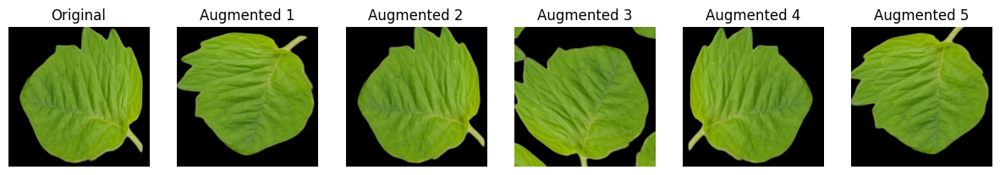

In [34]:
import matplotlib.pyplot as plt
import tensorflow as tf

for img, _ in train_ds.take(1):
    img = img[0]

augmented_imgs = [data_augmentation(img[tf.newaxis, ...])[0] for _ in range(5)]

img_np = img.numpy().astype('uint8')
augmented_imgs_np = [aug_img.numpy().astype('uint8') for aug_img in augmented_imgs]

# Plot the original image followed by the augmented images
imgs = [img_np] + augmented_imgs_np
titles = ['Original'] + [f'Augmented {i+1}' for i in range(5)]

plt.figure(figsize=(15, 5))
for i in range(6):
    plt.subplot(1, 6, i + 1)
    plt.imshow(imgs[i])
    plt.title(titles[i])
    plt.axis('off')

plt.show()


In [ ]:
train_ds = train_ds_aug
val_ds = val_ds_aug
val_ds = val_ds_aug

*4*. Model building

**1. CNN**

In [ ]:
NUM_CLASSES = 2  # Number of classes for binary classification

input_shape = (IMG_SIZE, IMG_SIZE, 3)

model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(NUM_CLASSES, activation='sigmoid'),
])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 64)        36928     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 30, 30, 64)       

In [ ]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.binaryCrossentropy(from_logits=False),
    metrics=['accuracy']
)


In [ ]:
history=model.fit(
        train_ds,
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        verbose=1,
        validation_data=val_ds,
        use_multiprocessing=True
    )

Epoch 1/50
7/7 [==============================] - 31s 3s/step - loss: 5.7012 - accuracy: 0.5067 - val_loss: 0.7827 - val_accuracy: 0.6250
Epoch 2/50
7/7 [==============================] - 22s 3s/step - loss: 1.0121 - accuracy: 0.6368 - val_loss: 0.7902 - val_accuracy: 0.4688
Epoch 3/50
7/7 [==============================] - 22s 3s/step - loss: 0.5789 - accuracy: 0.7085 - val_loss: 0.6701 - val_accuracy: 0.6562
Epoch 4/50
7/7 [==============================] - 22s 3s/step - loss: 0.5130 - accuracy: 0.7220 - val_loss: 0.7116 - val_accuracy: 0.6250
Epoch 5/50
7/7 [==============================] - 25s 4s/step - loss: 0.4607 - accuracy: 0.7623 - val_loss: 0.5629 - val_accuracy: 0.6875
Epoch 6/50
7/7 [==============================] - 22s 3s/step - loss: 0.4030 - accuracy: 0.7803 - val_loss: 0.4720 - val_accuracy: 0.7812
Epoch 7/50
7/7 [==============================] - 22s 3s/step - loss: 0.3364 - accuracy: 0.8565 - val_loss: 0.4929 - val_accuracy: 0.7500
Epoch 8/50
7/7 [==================

In [ ]:
scores=model.evaluate(test_ds)

2/2 [==============================] - 3s 857ms/step - loss: 0.5320 - accuracy: 0.9062


In [ ]:
scores

[0.5319547057151794, 0.90625]

In [ ]:
history

In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [ ]:
history.history['accuracy']

In [ ]:
history.history['loss']

[5.7012176513671875,
 1.012075662612915,
 0.5789342522621155,
 0.5130403637886047,
 0.4607373774051666,
 0.40302515029907227,
 0.3363617956638336,
 0.28640010952949524,
 0.2358240932226181,
 0.19176509976387024,
 0.16314154863357544,
 0.12496308237314224,
 0.11027926951646805,
 0.0665096715092659,
 0.07339300215244293,
 0.04231415316462517,
 0.021693378686904907,
 0.021547723561525345,
 0.03039454109966755,
 0.012834628112614155,
 0.21135516464710236,
 0.19818682968616486,
 0.13621897995471954,
 0.06598427146673203,
 0.06971842795610428,
 0.05613049864768982,
 0.023152843117713928,
 0.012113182805478573,
 0.006153078284114599,
 0.0023125556763261557,
 0.0017551550408825278,
 0.0010783873731270432,
 0.0008533400250598788,
 0.0007129470468498766,
 0.0005843804683536291,
 0.0005201046005822718,
 0.0004581999673973769,
 0.0004259954730514437,
 0.0003877295821439475,
 0.0003577070601750165,
 0.00033272377913817763,
 0.00031341685098595917,
 0.0002935427473857999,
 0.00027538338326849043,
 0

In [ ]:
history.history['val_loss']

[0.7826757431030273,
 0.7901954054832458,
 0.6700989007949829,
 0.7116231918334961,
 0.5629304051399231,
 0.47200852632522583,
 0.4928712546825409,
 0.4225676357746124,
 0.36018210649490356,
 0.3661031126976013,
 0.29478102922439575,
 0.41775405406951904,
 0.39379918575286865,
 0.32786157727241516,
 0.4223281741142273,
 0.27627062797546387,
 0.24451543390750885,
 0.2533119320869446,
 0.29434913396835327,
 0.34266385436058044,
 1.047872543334961,
 0.36733126640319824,
 0.30895113945007324,
 0.397699773311615,
 0.39682525396347046,
 0.3848048150539398,
 0.43196043372154236,
 0.37032049894332886,
 0.4046846032142639,
 0.4777968227863312,
 0.4934147298336029,
 0.4927096962928772,
 0.4977579712867737,
 0.5076704025268555,
 0.5141901969909668,
 0.5191286206245422,
 0.5219162106513977,
 0.5234084129333496,
 0.5251961946487427,
 0.5270698070526123,
 0.5289686918258667,
 0.5303255915641785,
 0.5311204195022583,
 0.5339800715446472,
 0.5360410809516907,
 0.5370136499404907,
 0.53853440284729,
 0

In [ ]:
history.history['val_accuracy']

[0.625,
 0.46875,
 0.65625,
 0.625,
 0.6875,
 0.78125,
 0.75,
 0.78125,
 0.84375,
 0.875,
 0.875,
 0.90625,
 0.90625,
 0.90625,
 0.9375,
 0.9375,
 0.9375,
 0.90625,
 0.9375,
 0.9375,
 0.71875,
 0.9375,
 0.9375,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.9375,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.90625]

In [ ]:
acc=history.history['accuracy']
loss=history.history['loss']

val_accuracy=history.history['val_accuracy']
val_loss=history.history['val_loss']


Text(0.5, 1.0, 'training and validation loss')

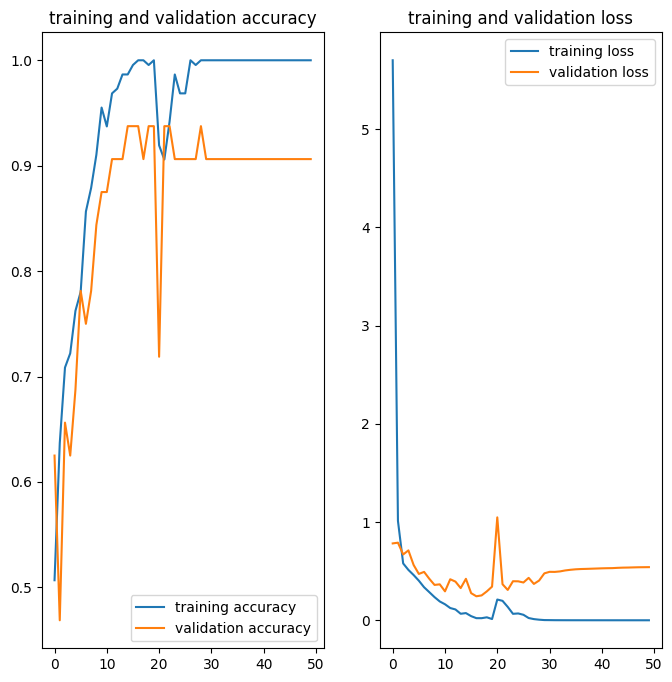

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc,label='training accuracy')
plt.plot(range(EPOCHS), val_accuracy,label='validation accuracy')
plt.legend(loc='lower right')
plt.title('training and validation accuracy')


plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss,label='training loss')
plt.plot(range(EPOCHS), val_loss,label='validation loss')
plt.legend(loc='upper right')
plt.title('training and validation loss')

first image to predict
first image's actual label: infected
1/1 [==============================] - 3s 3s/step
predicted label: infected


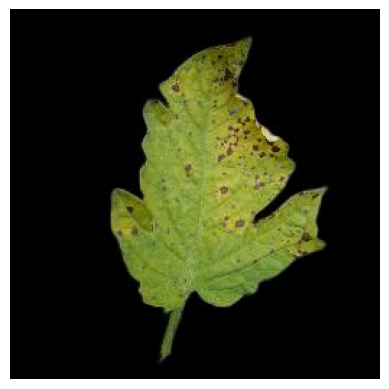

In [ ]:
for images_batch, labels_batch in test_ds.take(1):
    first_image=images_batch[0].numpy().astype('uint8')
    first_lable=labels_batch[0]

    print("first image to predict")
    plt.imshow(first_image)
    plt.axis('off')
    print("first image's actual label:", class_names[first_lable])

    batch_prediction=model.predict(images_batch)
    print("predicted label:", class_names[np.argmax(batch_prediction[0])])

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence


1/1 [==============================] - 0s 86ms/step


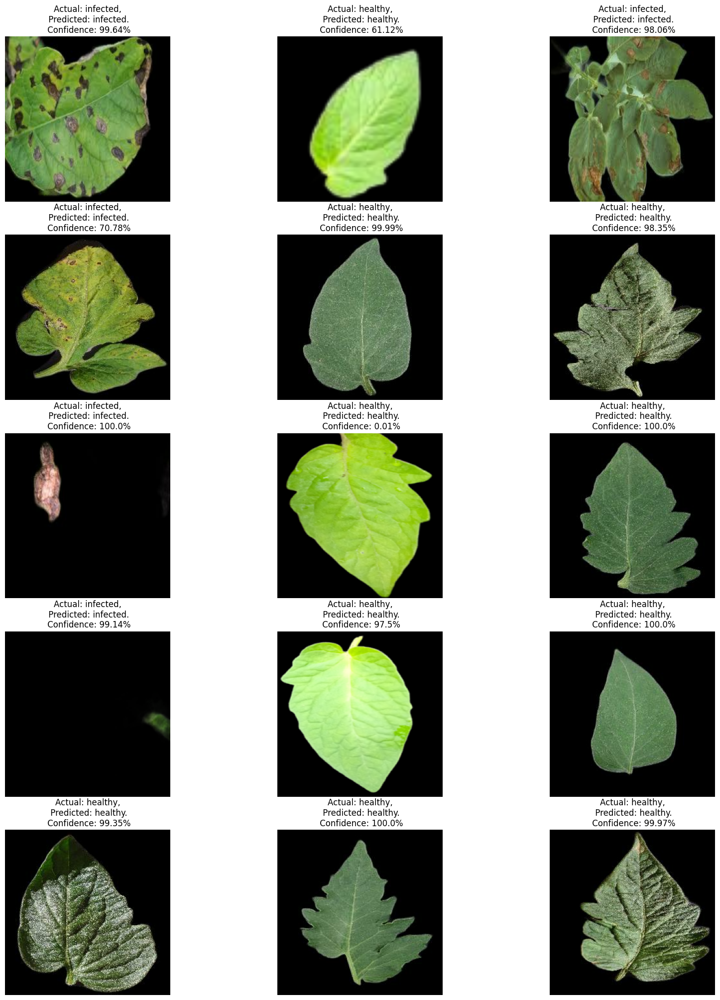

In [ ]:
plt.figure(figsize=(20, 25))
for images, labels in test_ds.take(1):
    for i in range(15):
        ax = plt.subplot(5, 3, i+1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

In [ ]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.metrics import classification_report
from tabulate import tabulate

precision = precision_score(true_labels_one_hot, predicted_labels, average='weighted')
recall = recall_score(true_labels_one_hot, predicted_labels, average='weighted')
f1 = f1_score(true_labels_one_hot, predicted_labels, average='weighted')
accuracy = accuracy_score(true_labels_one_hot, predicted_labels)

# Generate the confusion matrix
cm = confusion_matrix(np.argmax(true_labels_one_hot, axis=1), np.argmax(predicted_labels, axis=1))

report = classification_report(np.argmax(true_labels_one_hot, axis=1), np.argmax(predicted_labels, axis=1), target_names=['Healthy', 'Infected'])

data = [['Precision', precision], ['Recall', recall], ['F1 Score', f1], ['Accuracy', accuracy]]

# Display the metrics in a table
print(tabulate(data, headers=['Metric', 'Value'], tablefmt="pretty"))

print("\nConfusion Matrix:")
print(cm)

print("\nClassification Report:\n", report)


+-----------+--------------------+
|  Metric   |       Value        |
+-----------+--------------------+
| Precision | 0.9071356275303644 |
|  Recall   |      0.90625       |
| F1 Score  | 0.9057807807807807 |
| Accuracy  |      0.90625       |
+-----------+--------------------+

Confusion Matrix:
[[34  2]
 [ 4 24]]

Classification Report:
               precision    recall  f1-score   support

     Healthy       0.89      0.94      0.92        36
    Infected       0.92      0.86      0.89        28

    accuracy                           0.91        64
   macro avg       0.91      0.90      0.90        64
weighted avg       0.91      0.91      0.91        64



2. Transfer Learning

In [ ]:
base_model = tf.keras.applications.MobileNetV3(input_shape = (256, 256, 3), include_top = False, weights = "imagenet")

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
# we add this GlobalAveragePooling2D layers as we use the pretrained MobilentV2
base_model.trainable = False
model2 = tf.keras.Sequential([base_model,
                                 tf.keras.layers.GlobalAveragePooling2D(),
                                 tf.keras.layers.Dropout(0.2),
                                 tf.keras.layers.Dense(20, activation="sigmoid")
                                ])

In [ ]:
model2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 8, 8, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 20)                25620     
                                                                 
Total params: 2283604 (8.71 MB)
Trainable params: 25620 (100.08 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [ ]:
base_learning_rate = 0.0001
model2.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history1 = model2.fit(train_ds,epochs = 50 , validation_data = (val_ds))

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


7/7 [==============================] - 27s 3s/step - loss: 1.9110 - accuracy: 0.3543 - val_loss: 0.8718 - val_accuracy: 0.5000
Epoch 2/50
7/7 [==============================] - 13s 2s/step - loss: 0.7197 - accuracy: 0.5919 - val_loss: 0.7690 - val_accuracy: 0.5312
Epoch 3/50
7/7 [==============================] - 14s 2s/step - loss: 0.5759 - accuracy: 0.7175 - val_loss: 0.6580 - val_accuracy: 0.5625
Epoch 4/50
7/7 [==============================] - 13s 2s/step - loss: 0.5363 - accuracy: 0.7489 - val_loss: 0.5698 - val_accuracy: 0.5938
Epoch 5/50
7/7 [==============================] - 14s 2s/step - loss: 0.4873 - accuracy: 0.7713 - val_loss: 0.5010 - val_accuracy: 0.7500
Epoch 6/50
7/7 [==============================] - 13s 2s/step - loss: 0.4712 - accuracy: 0.7803 - val_loss: 0.4459 - val_accuracy: 0.7812
Epoch 7/50
7/7 [==============================] - 13s 2s/step - loss: 0.4146 - accuracy: 0.8386 - val_loss: 0.3717 - val_accuracy: 0.9375
Epoch 8/50
7/7 [=============================

In [ ]:
scores=model2.evaluate(test_ds)

2/2 [==============================] - 10s 4s/step - loss: 0.1165 - accuracy: 0.9688


In [ ]:
history1.history['accuracy']

[0.35426008701324463,
 0.591928243637085,
 0.7174887657165527,
 0.7488788962364197,
 0.7713004350662231,
 0.7802690863609314,
 0.8385650515556335,
 0.8834080696105957,
 0.847533643245697,
 0.865470826625824,
 0.8968609571456909,
 0.9147982001304626,
 0.9013453125953674,
 0.8878923654556274,
 0.9058296084403992,
 0.9327354431152344,
 0.9147982001304626,
 0.9506726264953613,
 0.9417040348052979,
 0.9327354431152344,
 0.9282511472702026,
 0.9641255736351013,
 0.9596412777900696,
 0.9372197389602661,
 0.9596412777900696,
 0.9641255736351013,
 0.9461883306503296,
 0.9506726264953613,
 0.9506726264953613,
 0.9551569223403931,
 0.9506726264953613,
 0.9641255736351013,
 0.9417040348052979,
 0.9596412777900696,
 0.9641255736351013,
 0.9686098694801331,
 0.9730941653251648,
 0.9775784611701965,
 0.9641255736351013,
 0.9820627570152283,
 0.9865471124649048,
 0.9910314083099365,
 0.9820627570152283,
 0.9730941653251648,
 0.9641255736351013,
 0.9775784611701965,
 0.9686098694801331,
 0.982062757015

In [ ]:
history1.history['val_loss']

[0.8718361854553223,
 0.768961489200592,
 0.6580288410186768,
 0.569780707359314,
 0.50098717212677,
 0.4458915591239929,
 0.37167787551879883,
 0.33363431692123413,
 0.3074127435684204,
 0.26820167899131775,
 0.24524544179439545,
 0.22600622475147247,
 0.21494194865226746,
 0.19191288948059082,
 0.18104970455169678,
 0.1726444959640503,
 0.15550857782363892,
 0.1503014862537384,
 0.14296789467334747,
 0.1320173740386963,
 0.1251910924911499,
 0.12424621731042862,
 0.11676183342933655,
 0.1065506786108017,
 0.11319655925035477,
 0.10293754935264587,
 0.0984000712633133,
 0.09326013922691345,
 0.09450870752334595,
 0.08316227793693542,
 0.08559702336788177,
 0.0806417465209961,
 0.07426037639379501,
 0.0855564996600151,
 0.0782451182603836,
 0.07052022218704224,
 0.06575565785169601,
 0.06959611177444458,
 0.07220279425382614,
 0.06322917342185974,
 0.056778132915496826,
 0.06030392274260521,
 0.058295294642448425,
 0.05357690900564194,
 0.05867617949843407,
 0.05481455475091934,
 0.049

In [ ]:
history1.history['val_accuracy']

[0.5,
 0.53125,
 0.5625,
 0.59375,
 0.75,
 0.78125,
 0.9375,
 0.9375,
 0.875,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0]

In [ ]:
def predict(model2, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model2.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence


1/1 [==============================] - 0s 134ms/step


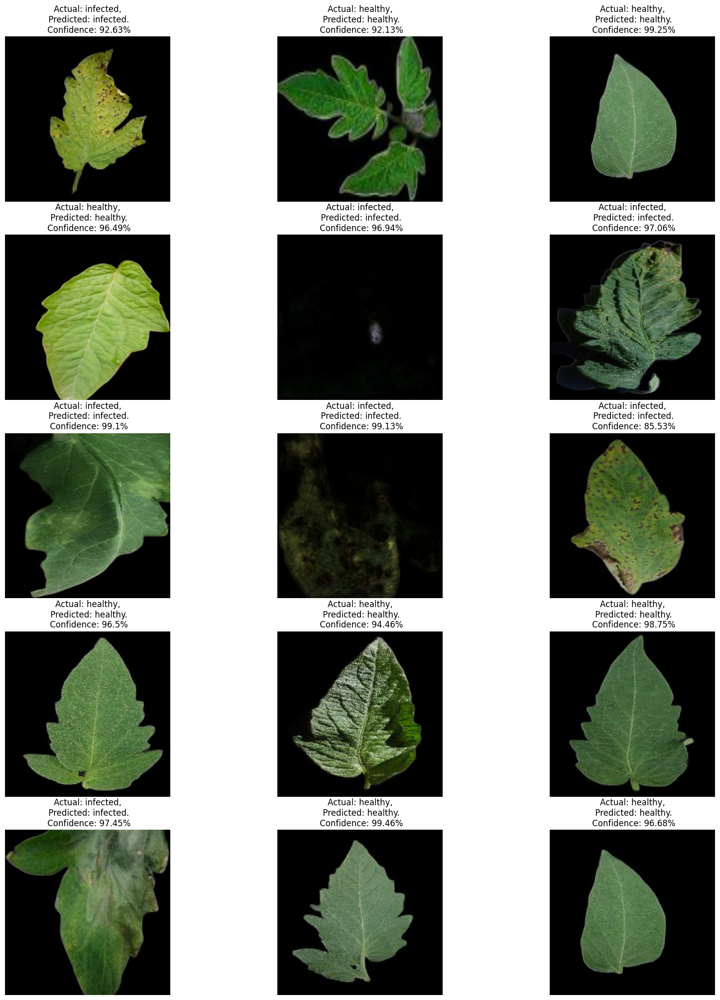

In [ ]:
plt.figure(figsize=(20, 25))
for images, labels in test_ds.take(1):
    for i in range(15):
        ax = plt.subplot(5, 3, i+1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model2, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

In [ ]:
acc=history1.history['accuracy']
loss=history1.history['loss']
val_accuracy=history1.history['val_accuracy']
val_loss=history1.history['val_loss']

Text(0.5, 1.0, 'training and validation loss')

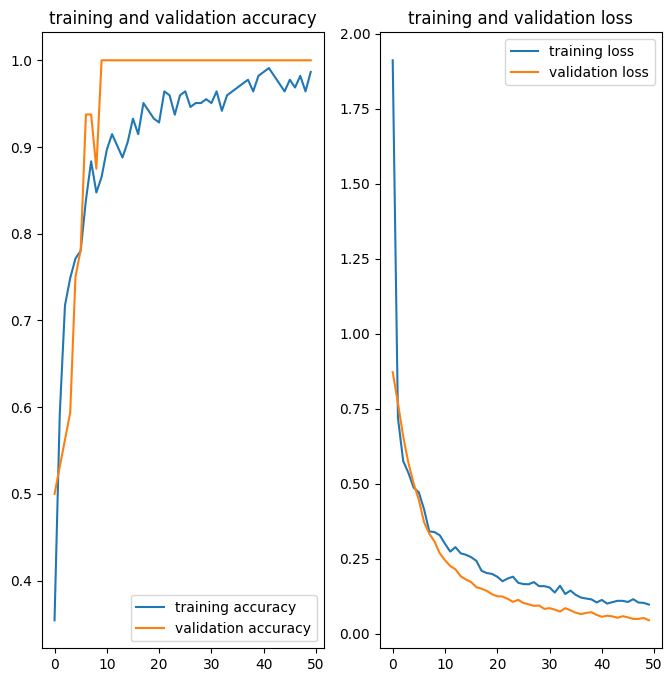

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc,label='training accuracy')
plt.plot(range(EPOCHS), val_accuracy,label='validation accuracy')
plt.legend(loc='lower right')
plt.title('training and validation accuracy')
plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss,label='training loss')
plt.plot(range(EPOCHS), val_loss,label='validation loss')
plt.legend(loc='upper right')
plt.title('training and validation loss')

In [ ]:
metrics = model2.evaluate(test_ds)
print(f'Loss : {round(100 * metrics[0], 2)}%')
print(f'Acc  : {round(100 * metrics[1], 2)}%')

2/2 [==============================] - 3s 1s/step - loss: 0.1165 - accuracy: 0.9688
Loss : 11.65%
Acc  : 96.88%


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
from tabulate import tabulate
y_pred = model2.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)

y_true = np.concatenate([y for x, y in test_ds], axis=0)

conf_matrix = confusion_matrix(y_true, y_pred_classes)

print("Confusion Matrix:")
print(conf_matrix)

TP = np.diag(conf_matrix)
FP = np.sum(conf_matrix, axis=0) - TP
FN = np.sum(conf_matrix, axis=1) - TP
precision = np.mean(TP / (TP + FP))
recall = np.mean(TP / (TP + FN))
f1 = np.mean(2 * (precision * recall) / (precision + recall))

accuracy = np.sum(TP) / np.sum(conf_matrix)

metrics = [['Precision', precision], ['Recall', recall], ['F1 Score', f1], ['Accuracy', accuracy]]
print("\nMetrics:")
print(tabulate(metrics, headers=['Metrics', 'Value'], tablefmt="pretty"))


2/2 [==============================] - 4s 1s/step
Confusion Matrix:
[[33  2]
 [ 0 29]]

Metrics:
+-----------+--------------------+
|  Metric   |       Value        |
+-----------+--------------------+
| Precision | 0.967741935483871  |
|  Recall   | 0.9714285714285714 |
| F1 Score  | 0.9695817490494296 |
| Accuracy  |      0.96875       |
+-----------+--------------------+


**3. InceptionV3**

In [ ]:
# Load the pre-trained InceptionV3 model without the top layers
base_model = tf.keras.applications.InceptionV3(input_shape=(256, 256, 3),
                                                include_top=False,
                                                weights='imagenet')

87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
base_model.trainable = False
# Build the model with new layers on top of the base model
model3 = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(20, activation='sigmoid')
])

base_learning_rate = 0.0001

model3.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
# Train the model with the new layers
history = model3.fit(train_ds, epochs = EPOCHS, validation_data=(val_ds))
# Unfreeze some or all layers of the base model for fine-tuning
for layer in base_model.layers:
    layer.trainable = True

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


7/7 [==============================] - 59s 8s/step - loss: 14.4310 - accuracy: 0.3363 - val_loss: 5.9149 - val_accuracy: 0.4688
Epoch 2/50
7/7 [==============================] - 46s 7s/step - loss: 4.6335 - accuracy: 0.5291 - val_loss: 3.1296 - val_accuracy: 0.4688
Epoch 3/50
7/7 [==============================] - 48s 7s/step - loss: 3.3799 - accuracy: 0.5919 - val_loss: 4.3949 - val_accuracy: 0.5312
Epoch 4/50
7/7 [==============================] - 36s 5s/step - loss: 3.8569 - accuracy: 0.6233 - val_loss: 1.4260 - val_accuracy: 0.6250
Epoch 5/50
7/7 [==============================] - 36s 5s/step - loss: 3.5797 - accuracy: 0.6323 - val_loss: 0.9984 - val_accuracy: 0.7812
Epoch 6/50
7/7 [==============================] - 36s 5s/step - loss: 2.9961 - accuracy: 0.6547 - val_loss: 0.6307 - val_accuracy: 0.7812
Epoch 7/50
7/7 [==============================] - 42s 6s/step - loss: 2.7159 - accuracy: 0.6996 - val_loss: 0.6026 - val_accuracy: 0.8125
Epoch 8/50
7/7 [============================

In [ ]:
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 20)                40980     
                                                                 
Total params: 21843764 (83.33 MB)
Trainable params: 40980 (160.08 KB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


**Performance Evalution**

In [ ]:
history.history['accuracy']

[0.3363228738307953,
 0.5291479825973511,
 0.591928243637085,
 0.6233183741569519,
 0.6322869658470154,
 0.6547085046768188,
 0.6995515823364258,
 0.726457417011261,
 0.6860986351966858,
 0.713004469871521,
 0.713004469871521,
 0.7309417128562927,
 0.7488788962364197,
 0.7443946003913879,
 0.7309417128562927,
 0.7847533822059631,
 0.7623318433761597,
 0.7802690863609314,
 0.7937219738960266,
 0.7443946003913879,
 0.7892376780509949,
 0.7488788962364197,
 0.7757847309112549,
 0.7802690863609314,
 0.8071748614311218,
 0.7892376780509949,
 0.8206278085708618,
 0.8116592168807983,
 0.8430493474006653,
 0.8385650515556335,
 0.834080696105957,
 0.8385650515556335,
 0.834080696105957,
 0.8744394779205322,
 0.8161435127258301,
 0.834080696105957,
 0.8565022349357605,
 0.8520179390907288,
 0.847533643245697,
 0.834080696105957,
 0.8385650515556335,
 0.7757847309112549,
 0.8878923654556274,
 0.8071748614311218,
 0.8116592168807983,
 0.8430493474006653,
 0.8968609571456909,
 0.8565022349357605,
 

In [ ]:
history.history['loss']

[14.430967330932617,
 4.633503437042236,
 3.379920482635498,
 3.8569459915161133,
 3.579694986343384,
 2.9961161613464355,
 2.7158901691436768,
 1.9388134479522705,
 2.7863447666168213,
 2.480768918991089,
 2.345062494277954,
 1.908829927444458,
 1.8858487606048584,
 1.96930730342865,
 1.6372902393341064,
 1.2671558856964111,
 1.210439682006836,
 1.2142219543457031,
 1.233985424041748,
 1.4327080249786377,
 1.036307692527771,
 1.1930798292160034,
 1.42573881149292,
 1.2447177171707153,
 1.0911411046981812,
 1.2705848217010498,
 0.9002038240432739,
 0.6978381872177124,
 0.6846258044242859,
 0.8235390782356262,
 0.8946678042411804,
 0.884617030620575,
 0.6720356345176697,
 0.8178279995918274,
 0.8369412422180176,
 0.7478735446929932,
 0.657576322555542,
 0.4936010241508484,
 0.6109508275985718,
 0.6502087116241455,
 0.546873152256012,
 0.9831597805023193,
 0.489166796207428,
 0.7575048804283142,
 0.8253645896911621,
 0.6298077702522278,
 0.3713819086551666,
 0.603836715221405,
 0.3960348

In [ ]:
history.history['val_loss']

[5.9148993492126465,
 3.1295628547668457,
 4.394873142242432,
 1.425960898399353,
 0.9983507394790649,
 0.6307055354118347,
 0.6026436686515808,
 1.2396857738494873,
 0.420251727104187,
 0.5057390928268433,
 0.49576616287231445,
 0.802935004234314,
 0.23789015412330627,
 0.5572108030319214,
 0.3425109386444092,
 0.5322495698928833,
 0.21908560395240784,
 0.4473322033882141,
 0.18370313942432404,
 0.2433258593082428,
 0.5553157329559326,
 0.38572701811790466,
 0.5690868496894836,
 0.31330880522727966,
 0.2846646010875702,
 0.31387802958488464,
 0.31384527683258057,
 0.3325202763080597,
 0.3919846713542938,
 0.19481882452964783,
 0.2774497866630554,
 0.4760572612285614,
 0.12625862658023834,
 0.1676853597164154,
 0.2772945463657379,
 0.12327977269887924,
 0.2762134373188019,
 0.2576836049556732,
 0.13460399210453033,
 0.42707622051239014,
 0.22590500116348267,
 0.18013285100460052,
 0.2704828977584839,
 0.687504768371582,
 0.23000776767730713,
 0.13602817058563232,
 0.6269659996032715,
 

In [ ]:
history.history['val_accuracy']

[0.46875,
 0.46875,
 0.53125,
 0.625,
 0.78125,
 0.78125,
 0.8125,
 0.78125,
 0.84375,
 0.9375,
 0.8125,
 0.84375,
 0.9375,
 0.90625,
 0.875,
 0.9375,
 0.90625,
 0.9375,
 0.9375,
 0.9375,
 0.875,
 0.875,
 0.90625,
 0.9375,
 0.90625,
 0.9375,
 0.9375,
 0.9375,
 0.9375,
 0.9375,
 0.9375,
 0.9375,
 0.90625,
 0.9375,
 0.9375,
 0.9375,
 0.9375,
 0.9375,
 0.9375,
 0.9375,
 0.9375,
 0.90625,
 0.875,
 0.90625,
 0.9375,
 0.90625,
 0.875,
 0.9375,
 0.96875,
 0.9375]

In [ ]:
acc=history.history['accuracy']
loss=history.history['loss']

val_accuracy=history.history['val_accuracy']
val_loss=history.history['val_loss']

Text(0.5, 1.0, 'training and validation loss')

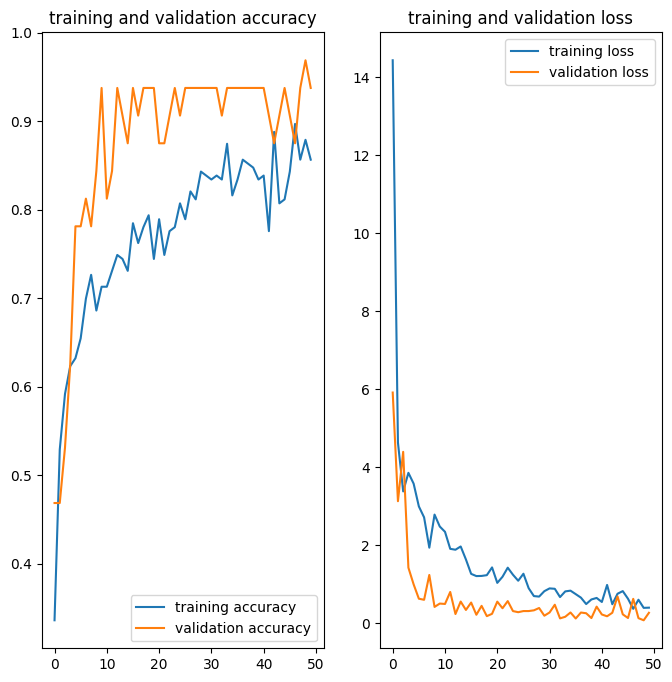

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc,label='training accuracy')
plt.plot(range(EPOCHS), val_accuracy,label='validation accuracy')
plt.legend(loc='lower right')
plt.title('training and validation accuracy')


plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss,label='training loss')
plt.plot(range(EPOCHS), val_loss,label='validation loss')
plt.legend(loc='upper right')
plt.title('training and validation loss')

**Make Predictions using InceptionV3**

1/1 [==============================] - 0s 145ms/step


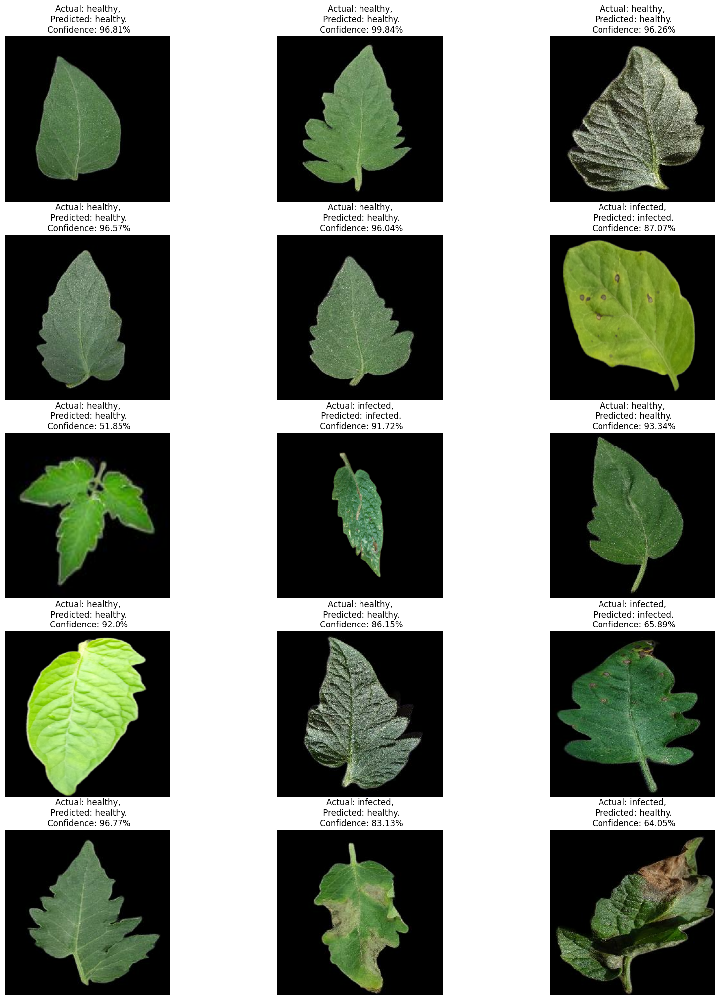

In [ ]:
def predict(model3, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model3.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence
plt.figure(figsize=(20, 25))
for images, labels in test_ds.take(1):
    for i in range(15):
        ax = plt.subplot(5, 3, i+1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model3, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

In [ ]:
metrics = model3.evaluate(test_ds)
print(f'Loss : {round(100 * metrics[0], 1)}%')
print(f'Acc  : {round(100 * metrics[1], 1)}%')

2/2 [==============================] - 10s 4s/step - loss: 0.2985 - accuracy: 0.8906
Loss : 29.9%
Acc  : 89.1%


In [ ]:
import numpy as np

predictions = model3.predict(test_ds)
predicted_labels = np.argmax(predictions, axis=1)

2/2 [==============================] - 21s 9s/step


**Fine Tuning InceptionV3**

In [ ]:
# Recompile the model with a lower learning rate for fine-tuning
base_learning_rate = 0.00001
model3.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:

# Continue training (fine-tuning) the model
history_fine_tune = model3.fit(train_ds, epochs=EPOCHS, validation_data=(val_ds))

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


7/7 [==============================] - 74s 7s/step - loss: 0.2439 - accuracy: 0.9238 - val_loss: 0.3704 - val_accuracy: 0.8438
Epoch 2/50
7/7 [==============================] - 42s 6s/step - loss: 0.1905 - accuracy: 0.9552 - val_loss: 0.3135 - val_accuracy: 0.8438
Epoch 3/50
7/7 [==============================] - 44s 6s/step - loss: 0.1568 - accuracy: 0.9731 - val_loss: 0.4399 - val_accuracy: 0.7500
Epoch 4/50
7/7 [==============================] - 43s 6s/step - loss: 0.1534 - accuracy: 0.9507 - val_loss: 0.2271 - val_accuracy: 0.8750
Epoch 5/50
7/7 [==============================] - 48s 7s/step - loss: 0.1408 - accuracy: 0.9641 - val_loss: 0.2553 - val_accuracy: 0.8438
Epoch 6/50
7/7 [==============================] - 43s 6s/step - loss: 0.1298 - accuracy: 0.9865 - val_loss: 0.1486 - val_accuracy: 0.9375
Epoch 7/50
7/7 [==============================] - 43s 6s/step - loss: 0.1329 - accuracy: 0.9776 - val_loss: 0.2096 - val_accuracy: 0.9062
Epoch 8/50
7/7 [=============================

In [ ]:
scores=model3.evaluate(test_ds)

2/2 [==============================] - 10s 5s/step - loss: 0.0499 - accuracy: 0.9844


In [ ]:
history_fine_tune.history['accuracy']

[0.9237667918205261,
 0.9551569223403931,
 0.9730941653251648,
 0.9506726264953613,
 0.9641255736351013,
 0.9865471124649048,
 0.9775784611701965,
 0.9730941653251648,
 0.9820627570152283,
 0.9820627570152283,
 0.9775784611701965,
 0.9775784611701965,
 0.9910314083099365,
 0.9955157041549683,
 0.9955157041549683,
 0.9820627570152283,
 1.0,
 0.9955157041549683,
 0.9955157041549683,
 1.0,
 0.9955157041549683,
 0.9865471124649048,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 0.9955157041549683,
 0.9910314083099365,
 1.0,
 1.0,
 1.0,
 0.9955157041549683,
 1.0,
 1.0,
 1.0,
 1.0,
 0.9955157041549683,
 1.0,
 1.0,
 0.9955157041549683,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0]

In [ ]:

history_fine_tune.history['loss']

[0.24391698837280273,
 0.19054405391216278,
 0.15680012106895447,
 0.1534181535243988,
 0.1407676339149475,
 0.12983985245227814,
 0.13287502527236938,
 0.13167952001094818,
 0.11667431145906448,
 0.101361945271492,
 0.10703778266906738,
 0.1057194173336029,
 0.09676282107830048,
 0.0835481733083725,
 0.07283483445644379,
 0.08987139165401459,
 0.07229448109865189,
 0.07152824848890305,
 0.06968864053487778,
 0.06319954991340637,
 0.06362717598676682,
 0.07143761962652206,
 0.05651605874300003,
 0.05491478741168976,
 0.05146341025829315,
 0.04629410803318024,
 0.04527030512690544,
 0.04851759970188141,
 0.05248086899518967,
 0.04667937755584717,
 0.041834790259599686,
 0.04167262464761734,
 0.04383067041635513,
 0.04487742483615875,
 0.04466409981250763,
 0.03758367896080017,
 0.038198184221982956,
 0.034346338361501694,
 0.03513185307383537,
 0.03241630643606186,
 0.030897872522473335,
 0.03267180919647217,
 0.03182368725538254,
 0.02912268228828907,
 0.026776015758514404,
 0.02854089

In [ ]:
history_fine_tune.history['val_loss']

[0.37038785219192505,
 0.31345510482788086,
 0.43991535902023315,
 0.22713547945022583,
 0.25525081157684326,
 0.14855362474918365,
 0.20959743857383728,
 0.14514346420764923,
 0.1452401876449585,
 0.1430066078901291,
 0.10900501906871796,
 0.13540273904800415,
 0.09472392499446869,
 0.09743096679449081,
 0.10365590453147888,
 0.0840318351984024,
 0.10437735915184021,
 0.07910296320915222,
 0.07585479319095612,
 0.08727890253067017,
 0.07290951162576675,
 0.07091392576694489,
 0.08927792310714722,
 0.06808392703533173,
 0.06715888530015945,
 0.06617769598960876,
 0.06463102996349335,
 0.06342668831348419,
 0.06221665441989899,
 0.061178021132946014,
 0.060320742428302765,
 0.059748463332653046,
 0.06206219643354416,
 0.06057532876729965,
 0.05862777680158615,
 0.058209128677845,
 0.05741523951292038,
 0.05770352482795715,
 0.05738560110330582,
 0.05903015658259392,
 0.057655129581689835,
 0.056321047246456146,
 0.05766331031918526,
 0.057505831122398376,
 0.0564923994243145,
 0.0568610

In [ ]:
history_fine_tune.history['val_accuracy']

[0.84375,
 0.84375,
 0.75,
 0.875,
 0.84375,
 0.9375,
 0.90625,
 0.9375,
 0.9375,
 0.96875,
 1.0,
 1.0,
 0.96875,
 1.0,
 1.0,
 1.0,
 0.96875,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 0.96875,
 1.0,
 1.0,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 1.0,
 0.96875,
 1.0]

In [ ]:
acc=history_fine_tune.history['accuracy']
loss=history_fine_tune.history['loss']
val_accuracy=history_fine_tune.history['val_accuracy']
val_loss=history_fine_tune.history['val_loss']

Text(0.5, 1.0, 'training and validation loss')

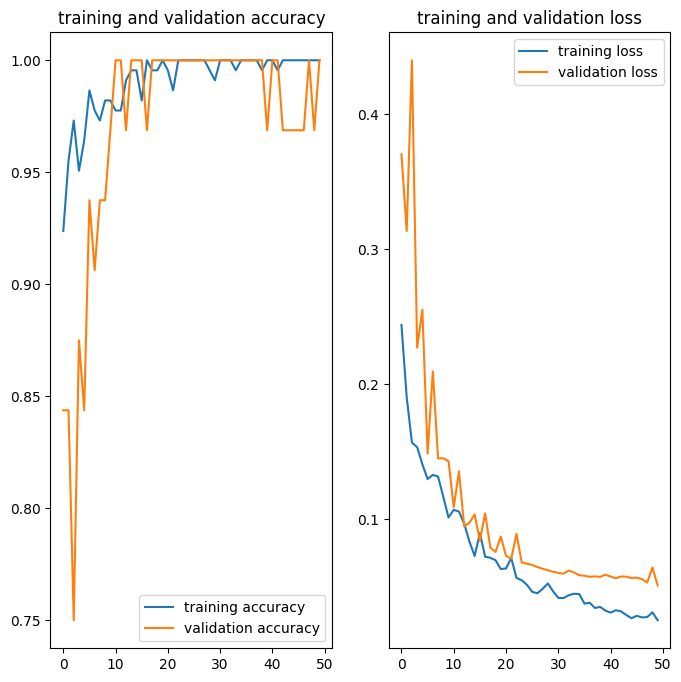

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc,label='training accuracy')
plt.plot(range(EPOCHS), val_accuracy,label='validation accuracy')
plt.legend(loc='lower right')
plt.title('training and validation accuracy')
plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss,label='training loss')
plt.plot(range(EPOCHS), val_loss,label='validation loss')
plt.legend(loc='upper right')
plt.title('training and validation loss')

**Make Prediction**

In [ ]:
def predict(model3, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)
    predictions = model3.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 155ms/step


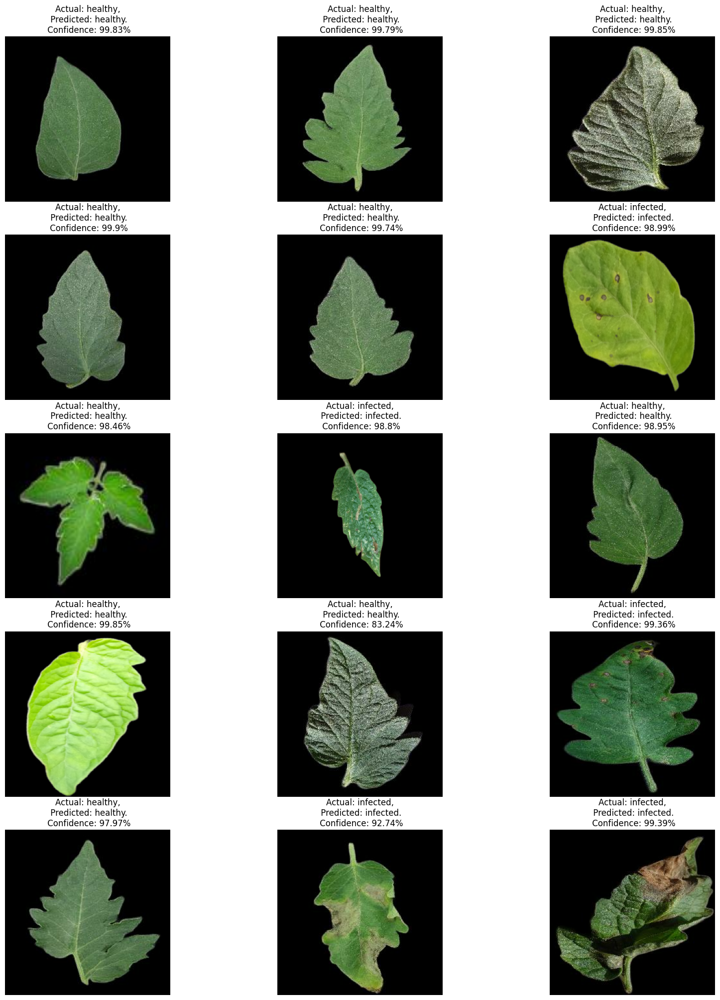

In [ ]:
plt.figure(figsize=(20, 25))
for images, labels in test_ds.take(1):
    for i in range(15):
        ax = plt.subplot(5, 3, i+1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model3, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

In [ ]:
# evaluating model using testing set
metrics = model3.evaluate(test_ds)
print(f'Loss : {round(100 * metrics[0], 2)}%')
print(f'Acc  : {round(100 * metrics[1], 2)}%')


2/2 [==============================] - 10s 4s/step - loss: 0.0499 - accuracy: 0.9844
Loss : 4.99%
Acc  : 98.44%


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
from tabulate import tabulate

y_pred = model3.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)

y_true = np.concatenate([y for x, y in test_ds], axis=0)

conf_matrix = confusion_matrix(y_true, y_pred_classes)

print("Confusion Matrix:")
print(conf_matrix)

TP = np.diag(conf_matrix)
FP = np.sum(conf_matrix, axis=0) - TP
FN = np.sum(conf_matrix, axis=1) - TP

# Precision, Recall, and F1 Score
precision = np.mean(TP / (TP + FP))
recall = np.mean(TP / (TP + FN))
f1 = np.mean(2 * (precision * recall) / (precision + recall))

# Accuracy
accuracy = np.sum(TP) / np.sum(conf_matrix)

# Display the calculated metrics
metrics = [['Precision', precision], ['Recall', recall], ['F1 Score', f1], ['Accuracy', accuracy]]
print("\nMetrics:")
print(tabulate(metrics, headers=['Metrics', 'Value'], tablefmt="pretty"))


2/2 [==============================] - 10s 5s/step
Confusion Matrix:
[[43  0]
 [ 1 20]]

Metrics:
+-----------+--------------------+
|  Metrics  |       Value        |
+-----------+--------------------+
| Precision | 0.9886363636363636 |
|  Recall   | 0.9761904761904762 |
| F1 Score  | 0.9823740016524374 |
| Accuracy  |      0.984375      |
+-----------+--------------------+


**4. DenseNet201**

In [ ]:
# Load the pre-trained DenseNet201 model without the top layers
base_model = tf.keras.applications.DenseNet201(input_shape=(256, 256, 3),
                                                include_top=False,
                                                weights='imagenet')

74836368/74836368 [==============================] - 1s 0us/step


In [ ]:
base_model.trainable = False
# Build the model with new layers on top of the base model
model4 = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(20, activation='sigmoid')
])

base_learning_rate = 0.0001

model4.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
# Train the model with the new layers
history4 = model4.fit(train_ds, epochs = EPOCHS, validation_data=(val_ds))



Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


7/7 [==============================] - 189s 18s/step - loss: 4.6151 - accuracy: 0.3139 - val_loss: 0.9070 - val_accuracy: 0.7500
Epoch 2/50
7/7 [==============================] - 95s 14s/step - loss: 1.2840 - accuracy: 0.5291 - val_loss: 0.6779 - val_accuracy: 0.6875
Epoch 3/50
7/7 [==============================] - 112s 17s/step - loss: 1.0146 - accuracy: 0.6502 - val_loss: 0.5843 - val_accuracy: 0.8438
Epoch 4/50
7/7 [==============================] - 95s 14s/step - loss: 0.7828 - accuracy: 0.7130 - val_loss: 0.5633 - val_accuracy: 0.8750
Epoch 5/50
7/7 [==============================] - 86s 12s/step - loss: 0.7569 - accuracy: 0.7668 - val_loss: 0.4263 - val_accuracy: 0.9062
Epoch 6/50
7/7 [==============================] - 86s 12s/step - loss: 0.7205 - accuracy: 0.7578 - val_loss: 0.4592 - val_accuracy: 0.9062
Epoch 7/50
7/7 [==============================] - 89s 13s/step - loss: 0.6068 - accuracy: 0.8117 - val_loss: 0.4178 - val_accuracy: 0.8750
Epoch 8/50
7/7 [====================

In [ ]:
history4.history['accuracy']

[0.3139013350009918,
 0.5291479825973511,
 0.6502242088317871,
 0.713004469871521,
 0.7668161392211914,
 0.7578475475311279,
 0.8116592168807983,
 0.8744394779205322,
 0.865470826625824,
 0.8834080696105957,
 0.8834080696105957,
 0.8609865307807922,
 0.8834080696105957,
 0.9147982001304626,
 0.9013453125953674,
 0.8968609571456909,
 0.8834080696105957,
 0.878923773765564,
 0.9372197389602661,
 0.9147982001304626,
 0.9417040348052979,
 0.9327354431152344,
 0.9596412777900696,
 0.9147982001304626,
 0.9327354431152344,
 0.9461883306503296,
 0.9417040348052979,
 0.9372197389602661,
 0.9417040348052979,
 0.9327354431152344,
 0.9641255736351013,
 0.9551569223403931,
 0.9417040348052979,
 0.9865471124649048,
 0.9461883306503296,
 0.9686098694801331,
 0.9461883306503296,
 0.9372197389602661,
 0.9372197389602661,
 0.9596412777900696,
 0.9641255736351013,
 0.9596412777900696,
 0.9596412777900696,
 0.9551569223403931,
 0.9641255736351013,
 0.9641255736351013,
 0.9506726264953613,
 0.9641255736351

In [ ]:

history4.history['loss']

[4.615077972412109,
 1.2839699983596802,
 1.0146377086639404,
 0.7828142046928406,
 0.756928026676178,
 0.7205414175987244,
 0.6067948341369629,
 0.48298943042755127,
 0.42548954486846924,
 0.3319458067417145,
 0.34148770570755005,
 0.36501333117485046,
 0.41628381609916687,
 0.2602519690990448,
 0.28552085161209106,
 0.29546216130256653,
 0.28608256578445435,
 0.3411407470703125,
 0.26986411213874817,
 0.22987793385982513,
 0.17288275063037872,
 0.17904652655124664,
 0.12738889455795288,
 0.2706249952316284,
 0.1934400200843811,
 0.20499838888645172,
 0.15077105164527893,
 0.1643010973930359,
 0.19034579396247864,
 0.19088974595069885,
 0.1214466318488121,
 0.11525339633226395,
 0.14568060636520386,
 0.09147964417934418,
 0.1572275310754776,
 0.14488354325294495,
 0.1372734159231186,
 0.13818922638893127,
 0.13560135662555695,
 0.10702501237392426,
 0.08873555809259415,
 0.10727228224277496,
 0.10152232646942139,
 0.12782904505729675,
 0.11249315738677979,
 0.11380166560411453,
 0.113

In [ ]:
history4.history['val_loss']

[0.9070056676864624,
 0.677923858165741,
 0.5843008756637573,
 0.5632947683334351,
 0.4262999892234802,
 0.4592103958129883,
 0.4178430736064911,
 0.38575929403305054,
 0.41626405715942383,
 0.3867684602737427,
 0.34556013345718384,
 0.3689976632595062,
 0.2922278046607971,
 0.24828676879405975,
 0.278669148683548,
 0.21773174405097961,
 0.21945099532604218,
 0.2970412075519562,
 0.2255823016166687,
 0.25318124890327454,
 0.24326054751873016,
 0.20438453555107117,
 0.269564688205719,
 0.2521527111530304,
 0.22445537149906158,
 0.23100094497203827,
 0.18954575061798096,
 0.2683286666870117,
 0.13821116089820862,
 0.14430329203605652,
 0.13679848611354828,
 0.1372174173593521,
 0.15022560954093933,
 0.1443714201450348,
 0.14163045585155487,
 0.132090762257576,
 0.16607099771499634,
 0.15094093978405,
 0.16433829069137573,
 0.14623887836933136,
 0.13953924179077148,
 0.16529209911823273,
 0.1489456593990326,
 0.12776735424995422,
 0.13645799458026886,
 0.12254710495471954,
 0.152010813355

In [ ]:
history4.history['val_accuracy']

[0.75,
 0.6875,
 0.84375,
 0.875,
 0.90625,
 0.90625,
 0.875,
 0.875,
 0.875,
 0.875,
 0.90625,
 0.90625,
 0.875,
 0.875,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.875,
 0.90625,
 0.90625,
 0.90625,
 0.90625,
 0.875,
 0.875,
 0.90625,
 0.90625,
 0.90625,
 0.96875,
 0.9375,
 0.90625,
 0.9375,
 0.90625,
 0.90625,
 0.9375,
 0.96875,
 0.9375,
 0.9375,
 0.9375,
 0.90625,
 0.90625,
 0.9375,
 0.90625,
 0.9375,
 0.9375,
 0.96875,
 0.96875,
 0.9375,
 0.96875,
 0.9375]

In [ ]:
# now i will plot this all parameters in nice matplotlib graph
acc=history4.history['accuracy']
loss=history4.history['loss']
val_accuracy=history4.history['val_accuracy']
val_loss=history4.history['val_loss']

Text(0.5, 1.0, 'training and validation loss')

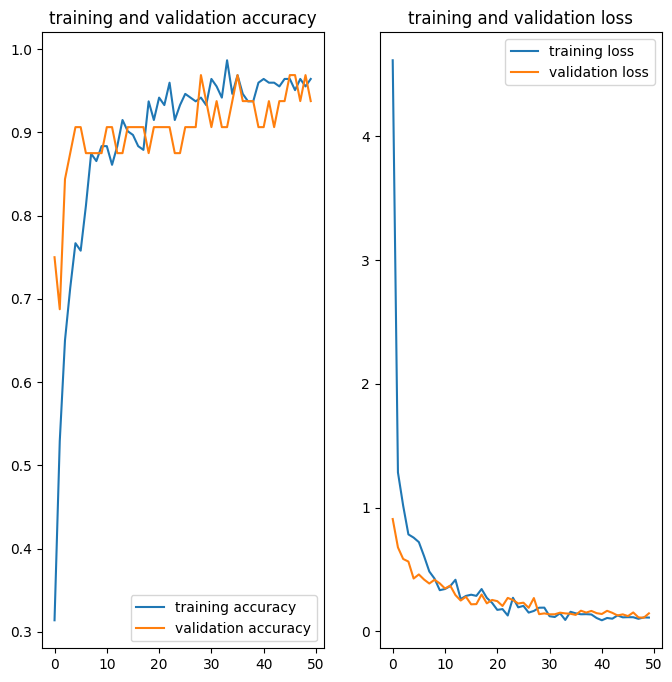

In [ ]:

plt.figure(figsize=(8,8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc,label='training accuracy')
plt.plot(range(EPOCHS), val_accuracy,label='validation accuracy')
plt.legend(loc='lower right')
plt.title('training and validation accuracy')


plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss,label='training loss')
plt.plot(range(EPOCHS), val_loss,label='validation loss')
plt.legend(loc='upper right')
plt.title('training and validation loss')

In [ ]:
model4.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet201 (Functional)    (None, 8, 8, 1920)        18321984  
                                                                 
 global_average_pooling2d (  (None, 1920)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 1920)              0         
                                                                 
 dense (Dense)               (None, 20)                38420     
                                                                 
Total params: 18360404 (70.04 MB)
Trainable params: 38420 (150.08 KB)
Non-trainable params: 18321984 (69.89 MB)
_________________________________________________________________


In [ ]:
# evaluating model using testing set
metrics = model4.evaluate(test_ds)
print(f'Loss : {round(100 * metrics[0], 2)}%')
print(f'Acc  : {round(100 * metrics[1], 2)}%')

2/2 [==============================] - 22s 9s/step - loss: 0.2804 - accuracy: 0.9375
Loss : 28.04%
Acc  : 93.75%


In [ ]:
def predict(model4, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model4.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence


1/1 [==============================] - 0s 271ms/step


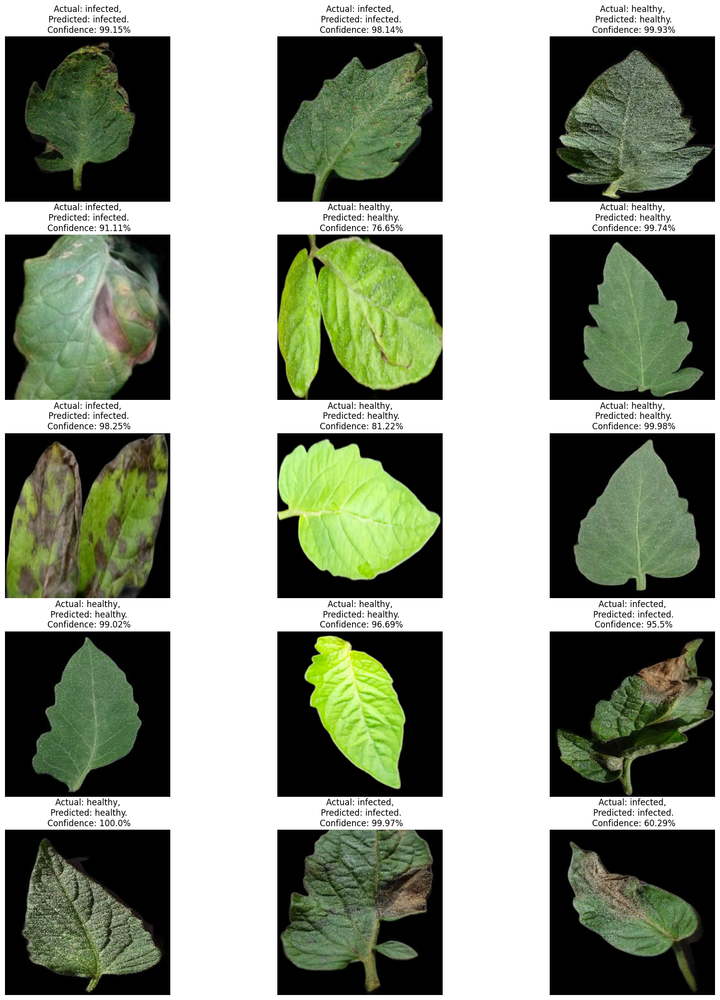

In [ ]:
plt.figure(figsize=(20, 25))
for images, labels in test_ds.take(1):
    for i in range(15):
        ax = plt.subplot(5, 3, i+1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model4, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
from tabulate import tabulate

y_pred = model4.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)

y_true = np.concatenate([y for x, y in test_ds], axis=0)

conf_matrix = confusion_matrix(y_true, y_pred_classes)

print("Confusion Matrix:")
print(conf_matrix)

TP = np.diag(conf_matrix)
FP = np.sum(conf_matrix, axis=0) - TP
FN = np.sum(conf_matrix, axis=1) - TP

precision = np.mean(TP / (TP + FP))
recall = np.mean(TP / (TP + FN))
f1 = np.mean(2 * (precision * recall) / (precision + recall))

accuracy = np.sum(TP) / np.sum(conf_matrix)
metrics = [['Precision', precision], ['Recall', recall], ['F1 Score', f1], ['Accuracy', accuracy]]
print("\nMetrics:")
print(tabulate(metrics, headers=['Metrics', 'Value'], tablefmt="pretty"))

2/2 [==============================] - 27s 11s/step
Confusion Matrix:
[[36  1]
 [ 3 24]]

Metrics:
+-----------+--------------------+
|  Metrics  |       Value        |
+-----------+--------------------+
| Precision | 0.9415384615384615 |
|  Recall   | 0.9309309309309309 |
| F1 Score  | 0.936204650428329  |
| Accuracy  |       0.9375       |
+-----------+--------------------+


**Fine Tune DenseNet201**

In [ ]:
# Unfreeze some or all layers of the base model for fine-tuning
for layer in base_model.layers:
    layer.trainable = True


In [ ]:
# Recompile the model with a lower learning rate for fine-tuning
base_learning_rate = 0.00001
model4.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
# Continue training (fine-tuning) the model
history_fine_tune4 = model4.fit(train_ds, epochs=EPOCHS, validation_data=(val_ds))


Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


7/7 [==============================] - 145s 19s/step - loss: 1.2792 - accuracy: 0.4350 - val_loss: 0.5310 - val_accuracy: 0.7812
Epoch 2/50
7/7 [==============================] - 129s 19s/step - loss: 0.8945 - accuracy: 0.5381 - val_loss: 0.4129 - val_accuracy: 0.7812
Epoch 3/50
7/7 [==============================] - 138s 20s/step - loss: 0.7095 - accuracy: 0.5919 - val_loss: 0.3572 - val_accuracy: 0.9062
Epoch 4/50
7/7 [==============================] - 129s 19s/step - loss: 0.5118 - accuracy: 0.7354 - val_loss: 0.3458 - val_accuracy: 0.9062
Epoch 5/50
7/7 [==============================] - 128s 18s/step - loss: 0.4444 - accuracy: 0.7937 - val_loss: 0.3232 - val_accuracy: 0.8438
Epoch 6/50
7/7 [==============================] - 130s 19s/step - loss: 0.3589 - accuracy: 0.8520 - val_loss: 0.3087 - val_accuracy: 0.8438
Epoch 7/50
7/7 [==============================] - 129s 19s/step - loss: 0.3225 - accuracy: 0.8475 - val_loss: 0.2856 - val_accuracy: 0.8438
Epoch 8/50
7/7 [===============

In [ ]:
scores=model4.evaluate(test_ds)

2/2 [==============================] - 21s 12s/step - loss: 0.0352 - accuracy: 1.0000


In [ ]:
history_fine_tune4.history['accuracy']
history_fine_tune4.history['loss']
history_fine_tune4.history['val_loss']
history_fine_tune4.history['val_accuracy']

[0.78125,
 0.78125,
 0.90625,
 0.90625,
 0.84375,
 0.84375,
 0.84375,
 0.78125,
 0.8125,
 0.875,
 0.96875,
 0.9375,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 0.96875,
 1.0,
 0.96875,
 0.96875,
 1.0,
 0.96875,
 0.96875,
 0.96875,
 1.0,
 1.0,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 1.0,
 0.96875,
 0.96875,
 0.96875,
 0.96875,
 0.96875]

In [ ]:
#now i will plot this all parameters in nice matplotlib graph

acc=history_fine_tune4.history['accuracy']
loss=history_fine_tune4.history['loss']
val_accuracy=history_fine_tune4.history['val_accuracy']
val_loss=history_fine_tune4.history['val_loss']

Text(0.5, 1.0, 'training and validation loss')

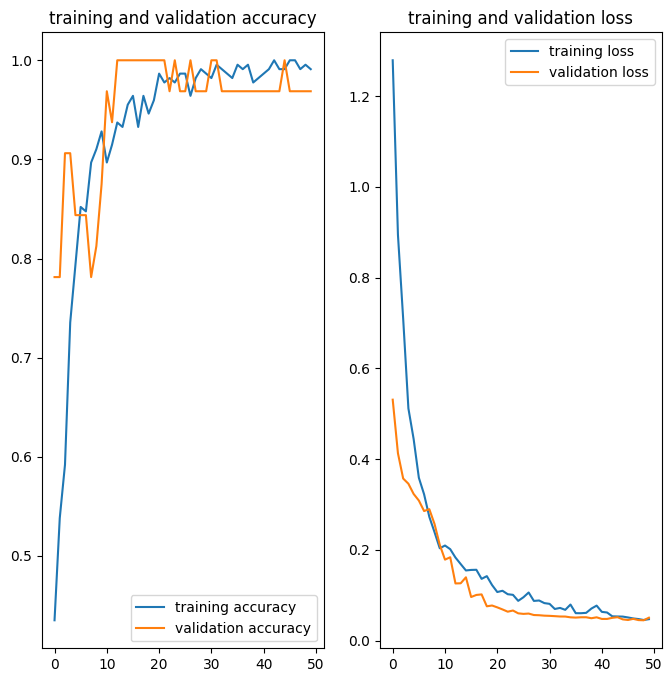

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc,label='training accuracy')
plt.plot(range(EPOCHS), val_accuracy,label='validation accuracy')
plt.legend(loc='lower right')
plt.title('training and validation accuracy')
plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss,label='training loss')
plt.plot(range(EPOCHS), val_loss,label='validation loss')
plt.legend(loc='upper right')
plt.title('training and validation loss')

In [ ]:
def predict(model4, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model4.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 271ms/step


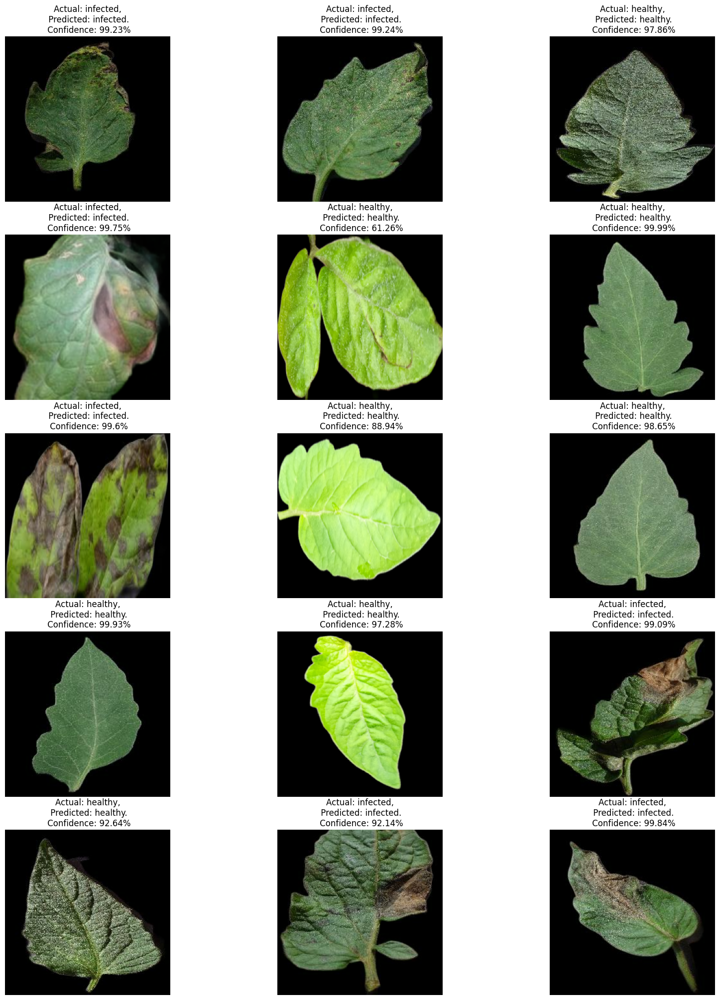

In [ ]:
plt.figure(figsize=(20, 25))
for images, labels in test_ds.take(1):
    for i in range(15):
        ax = plt.subplot(5, 3, i+1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model4, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

In [ ]:
# evaluating model using testing set
metrics = model4.evaluate(test_ds)
print(f'Loss : {round(100 * metrics[0], 2)}%')
print(f'Acc  : {round(100 * metrics[1], 2)}%')

2/2 [==============================] - 23s 11s/step - loss: 0.0352 - accuracy: 1.0000
Loss : 3.52%
Acc  : 100.0%


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
from tabulate import tabulate

y_pred = model4.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)

y_true = np.concatenate([y for x, y in test_ds], axis=0)

conf_matrix = confusion_matrix(y_true, y_pred_classes)

print("Confusion Matrix:")
print(conf_matrix)

TP = np.diag(conf_matrix)
FP = np.sum(conf_matrix, axis=0) - TP
FN = np.sum(conf_matrix, axis=1) - TP

precision = np.mean(TP / (TP + FP))
recall = np.mean(TP / (TP + FN))
f1 = np.mean(2 * (precision * recall) / (precision + recall))

# Accuracy
accuracy = np.sum(TP) / np.sum(conf_matrix)

metrics = [['Precision', precision], ['Recall', recall], ['F1 Score', f1], ['Accuracy', accuracy]]
print("\nMetrics:")
print(tabulate(metrics, headers=['Metrics', 'Value'], tablefmt="pretty"))

2/2 [==============================] - 27s 11s/step
Confusion Matrix:
[[37  0]
 [ 0 27]]

Metrics:
+-----------+-------+
|  Metrics  | Value |
+-----------+-------+
| Precision |  1.0  |
|  Recall   |  1.0  |
| F1 Score  |  1.0  |
| Accuracy  |  1.0  |
+-----------+-------+


**Applying Grad Cam**

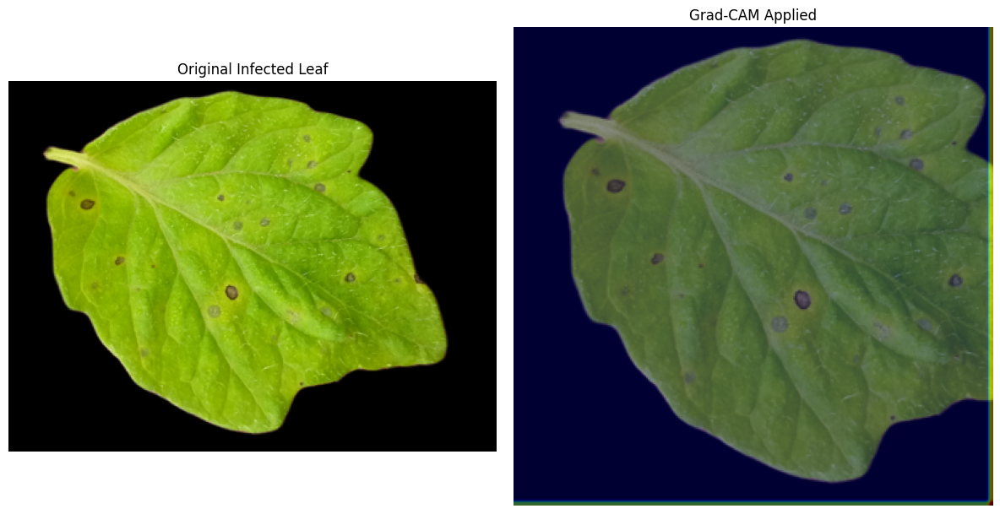

In [30]:
import matplotlib.image as mpimg
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import cv2

def load_mobilenetv2_model():
    """Load and return the pre-trained MobileNetV2 model."""
    return MobileNetV2(weights='imagenet', include_top=True)

def create_intermediate_model(base_model, last_conv_layer_name):
    """Create a model that outputs the activations of the last convolutional layer."""
    last_conv_layer = base_model.get_layer(last_conv_layer_name)
    return Model(inputs=base_model.input,
                 outputs=[last_conv_layer.output, base_model.output])

def grad_cam(intermediate_model, img_tensor, class_idx):
    """Generate Grad-CAM heatmap for the given image tensor and class index."""
    intermediate_model.trainable = False
    with tf.GradientTape() as tape:
        conv_outputs, predictions = intermediate_model(img_tensor)
        loss = predictions[:, class_idx]
    grads = tape.gradient(loss, conv_outputs)
    if grads is None:
        raise ValueError("Gradient computation returned None, which is unexpected.")
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    cam = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    cam = tf.nn.relu(cam)
    cam = cam / tf.reduce_max(cam)
    return cam.numpy().squeeze()

def preprocess_image(image_path, target_size=(224, 224)):
    """Load and preprocess the image."""
    original_img = mpimg.imread(image_path)
    if original_img.shape[-1] == 4:
        original_img = original_img[..., :3]
    img_resized = tf.image.resize(original_img, target_size)
    img_tensor = preprocess_input(img_resized)
    return tf.expand_dims(img_tensor, axis=0), original_img

def resize_heatmap(heatmap, original_img_shape):
    """Resize the heatmap to match the original image dimensions."""
    scale_factor = min(original_img_shape[0] / 224, original_img_shape[1] / 224)
    heatmap_resized = cv2.resize(heatmap, (int(scale_factor * 224), int(scale_factor * 224)))
    heatmap_resized = ((heatmap_resized - np.min(heatmap_resized)) / (np.max(heatmap_resized) - np.min(heatmap_resized))) * 255
    return heatmap_resized.astype(np.uint8)

def display_results(original_img, heatmap_resized):
    """Display the original image and the Grad-CAM heatmap side by side."""
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].imshow(original_img)
    axs[0].set_title('Original Infected Leaf')
    axs[0].axis('off')
    axs[1].imshow(original_img)
    axs[1].imshow(heatmap_resized, alpha=0.4, cmap='jet')
    axs[1].set_title('Grad-CAM Applied')
    axs[1].axis('off')
    plt.tight_layout()
    plt.show()

def main(image_path, last_conv_layer_name, class_idx):
    """Main function to run the Grad-CAM analysis and display results."""
    base_model = load_mobilenetv2_model()  # Load MobileNetV2
    intermediate_model = create_intermediate_model(base_model, last_conv_layer_name)
    img_tensor, original_img = preprocess_image(image_path)
    heatmap = grad_cam(intermediate_model, img_tensor, class_idx)
    heatmap_resized = resize_heatmap(heatmap, original_img.shape)
    display_results(original_img, heatmap_resized)

# Example usage
image_path = '/content/drive/MyDrive/TomatoLeafDetection/preprocessed/infected/Inf_ (10).PNG'  # Make sure to set the correct image path
last_conv_layer_name = 'Conv1'
class_idx = 0
main(image_path, last_conv_layer_name, class_idx)


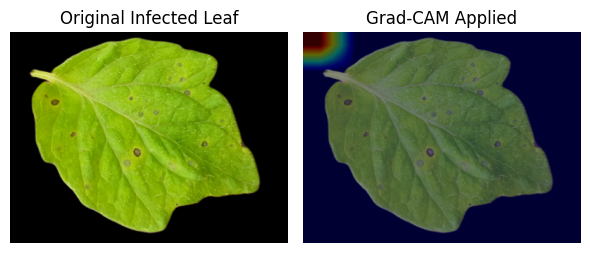

In [31]:
import matplotlib.image as mpimg
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import cv2
base_model = InceptionV3(weights='imagenet', include_top=True)

last_conv_layer_name = 'mixed10'
last_conv_layer = base_model.get_layer(last_conv_layer_name)
intermediate_model = Model(inputs=base_model.input,
                           outputs=[last_conv_layer.output, base_model.output])

def grad_cam(intermediate_model, img_tensor, class_idx):
    intermediate_model.trainable = False

    with tf.GradientTape() as tape:
        conv_outputs, predictions = intermediate_model(img_tensor)
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)

    if grads is None:
        raise ValueError("Gradient computation returned None, which is unexpected.")

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    cam = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    cam = tf.nn.relu(cam)
    cam = cam / tf.reduce_max(cam)
    heatmap = cam.numpy().squeeze()

    return heatmap

# Load the image
image_path = '/content/drive/MyDrive/TomatoLeafDetection/preprocessed/infected/Inf_ (10).PNG'
original_img = mpimg.imread(image_path)

if original_img.shape[-1] == 4:
    original_img = original_img[..., :3]

img_resized = tf.image.resize(original_img, [299, 299])

if len(img_resized.shape) > 3:
    img_resized = img_resized.squeeze(axis=0)
img_tensor = preprocess_input(img_resized)
img_tensor = tf.expand_dims(img_tensor, axis=0)

heatmap = grad_cam(intermediate_model, img_tensor, class_idx=0)

heatmap_resized = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))

heatmap_resized = ((heatmap_resized - np.min(heatmap_resized)) / (np.max(heatmap_resized) - np.min(heatmap_resized))) * 255

heatmap_resized = heatmap_resized.astype(np.uint8)

fig, axs = plt.subplots(1, 2, figsize=(6, 3))
axs[0].imshow(original_img)
axs[0].set_title('Original Infected Leaf')

axs[1].imshow(original_img)
axs[1].imshow(heatmap_resized, alpha=0.4, cmap='jet')
axs[1].set_title('Grad-CAM Applied')

for ax in axs:
    ax.axis('off')

plt.tight_layout()
plt.show()


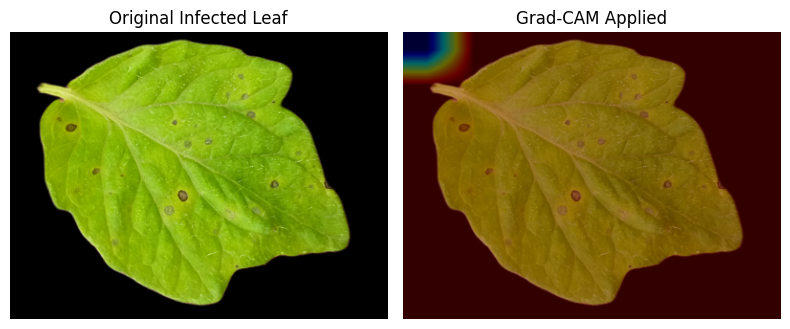

In [32]:
import matplotlib.image as mpimg
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import cv2

base_model = InceptionV3(weights='imagenet', include_top=True)

last_conv_layer_name = 'mixed10'
last_conv_layer = base_model.get_layer(last_conv_layer_name)

intermediate_model = Model(inputs=base_model.input,
                           outputs=[last_conv_layer.output, base_model.output])

def grad_cam(intermediate_model, img_tensor, class_idx):
    intermediate_model.trainable = False

    with tf.GradientTape() as tape:
        conv_outputs, predictions = intermediate_model(img_tensor)
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)

    if grads is None:
        raise ValueError("Gradient computation returned None, which is unexpected.")

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    cam = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    cam = tf.nn.relu(cam)
    cam = cam / tf.reduce_max(cam)
    heatmap = cam.numpy().squeeze()

    return heatmap

# Load the image
image_path = '/content/drive/MyDrive/TomatoLeafDetection/preprocessed/infected/Inf_ (10).PNG'
original_img = mpimg.imread(image_path)

if original_img.shape[-1] == 4:
    original_img = original_img[..., :3]

img_resized = tf.image.resize(original_img, [299, 299])

img_tensor = preprocess_input(img_resized)
img_tensor = tf.expand_dims(img_tensor, axis=0)

heatmap = grad_cam(intermediate_model, img_tensor, class_idx=0)

heatmap_resized = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))

heatmap_resized = np.uint8(255 * heatmap_resized)

heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

if original_img.dtype != np.uint8:
    original_img_uint8 = np.uint8(255 * original_img)
else:
    original_img_uint8 = original_img

overlayed_img = cv2.addWeighted(original_img_uint8, 0.6, heatmap_colored, 0.4, 0)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))

axs[0].imshow(original_img)
axs[0].set_title('Original Infected Leaf')
axs[0].axis('off')

axs[1].imshow(overlayed_img)
axs[1].set_title('Grad-CAM Applied')
axs[1].axis('off')

plt.tight_layout()
plt.show()


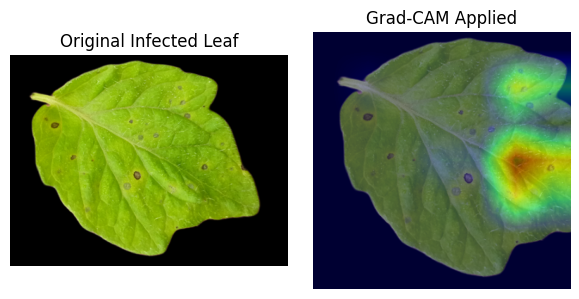

In [ ]:
import matplotlib.image as mpimg
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.densenet import DenseNet201, preprocess_input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import cv2

base_model = DenseNet201(weights='imagenet', include_top=True)

last_conv_layer_name = 'conv5_block32_2_conv'
last_conv_layer = base_model.get_layer(last_conv_layer_name)

intermediate_model = Model(inputs=base_model.input,
                           outputs=[last_conv_layer.output, base_model.output])

# Define the grad_cam function
def grad_cam(intermediate_model, img_tensor, class_idx):
    intermediate_model.trainable = False

    with tf.GradientTape() as tape:
        conv_outputs, predictions = intermediate_model(img_tensor)
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)

    if grads is None:
        raise ValueError("Gradient computation returned None, which is unexpected.")

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    cam = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    cam = tf.nn.relu(cam)
    cam = cam / tf.reduce_max(cam)
    heatmap = cam.numpy().squeeze()

    return heatmap

# Load the image
image_path = '/content/drive/MyDrive/TomatoLeafDetection/preprocessed/infected/Inf_ (10).PNG'
original_img = mpimg.imread(image_path)

if original_img.shape[-1] == 4:
    original_img = original_img[..., :3]

# Resize the image to match the input size expected by the DenseNet201 model
img_resized = tf.image.resize(original_img, [224, 224])

# Preprocess the image using DenseNet201's preprocessing function
# Ensure the image is in the correct format before preprocessing
if len(img_resized.shape) > 3:
    img_resized = img_resized.squeeze(axis=0)  # Remove singleton dimensions if present
img_tensor = preprocess_input(img_resized)
img_tensor = tf.expand_dims(img_tensor, axis=0)

# Invoke the grad_cam function with the preprocessed image tensor
heatmap = grad_cam(intermediate_model, img_tensor, class_idx=0)

# Assuming the heatmap is too small, resize it to match the original image dimensions
# Calculate the scaling factor to maintain the aspect ratio
scale_factor = min(original_img.shape[0] / 224, original_img.shape[1] / 224)
heatmap_resized = cv2.resize(heatmap, (int(scale_factor * 224), int(scale_factor * 224)))

heatmap_resized = ((heatmap_resized - np.min(heatmap_resized)) / (np.max(heatmap_resized) - np.min(heatmap_resized))) * 255

heatmap_resized = heatmap_resized.astype(np.uint8)

fig, axs = plt.subplots(1, 2, figsize=(6, 3))
axs[0].imshow(original_img)
axs[0].set_title('Original Infected Leaf')

axs[1].imshow(original_img)
axs[1].imshow(heatmap_resized, alpha=0.4, cmap='jet')
axs[1].set_title('Grad-CAM Applied')

for ax in axs:
    ax.axis('off')

plt.tight_layout()
plt.show()


**End of Implementations**